In [1]:
import tensorflow as tf
from matplotlib import pyplot as plt
%matplotlib inline
from matplotlib.pyplot import *
import pandas as pd

tf.reset_default_graph() #This will ensure that the variables get the names you intended, but it will invalidate previously-created graphs


In [100]:
cd /Users/Nevaeh/PythonCSCourse/XcodePython/FindCell2/Step2_MyNet/

/Users/Nevaeh/PythonCSCourse/XcodePython/FindCell2/Step2_MyNet


In [2]:
cd /Users/Nevaeh/DataInOut/FindPerfect_speed/My_Net_17/

/Users/Nevaeh/DataInOut/FindPerfect_speed/My_Net_17


In [2]:
cd /Users/Nevaeh/DataInOut/FindPerfect_speed/My_Net_9_1_Best/

/Users/Nevaeh/DataInOut/FindPerfect_speed/My_Net_9_1_Best


In [4]:
cd /Users/Nevaeh/DataInOut/FindPerfect/My_Net_11_2/

/Users/Nevaeh/DataInOut/FindPerfect/My_Net_11_2


In [5]:
# cd /Users/Nevaeh/DataInOut/Finished/My_Net_9_1/

In [3]:
import tensorflow as tf
import numpy as np
from matplotlib import pyplot as plt
import RHX_Input



###-- -------------------------------- --###
###-- Part 1: Define Variables   Start --###

def weight_variable(shape):
    initial = tf.truncated_normal(shape, stddev=0.1)
    return tf.Variable(initial)

def bias_variable(shape):
    initial = tf.constant(0.1,shape=shape)
    return tf.Variable(initial)

def conv2d(x,W):
    # stride [1, x_movement, y_movement, 1]
    # 'SAME' same as orign pic
    return tf.nn.conv2d(x, W, strides=[1, 2, 2, 1], padding='SAME')

def deconv2d(x,W,output_shape):
    # stride [1, x_movement, y_movement, 1]
    # 'SAME' same as orign pic
    return tf.nn.conv2d_transpose(x, W, output_shape, strides=[1, 2, 2, 1], padding='SAME')

def max_pool_2x2(x,name):
    # stride [1, x_movement, y_movement, 1]
    return tf.nn.max_pool(x, ksize=[1,3,3,1], strides=[1,1,1,1], padding='SAME',name = name)




def batchnorm(Ylogits, is_test, iteration, offset, convolutional=False):
    exp_moving_avg = tf.train.ExponentialMovingAverage(0.999, iteration) # adding the iteration prevents from averaging across non-existing iterations
    bnepsilon = 1e-5
    if convolutional:
        mean, variance = tf.nn.moments(Ylogits, [0, 1, 2])
    else:
        mean, variance = tf.nn.moments(Ylogits, [0])
    update_moving_everages = exp_moving_avg.apply([mean, variance])
    m = tf.cond(is_test, lambda: exp_moving_avg.average(mean), lambda: mean)
    v = tf.cond(is_test, lambda: exp_moving_avg.average(variance), lambda: variance)
    Ybn = tf.nn.batch_normalization(Ylogits, m, v, offset, None, bnepsilon)
    return Ybn, update_moving_everages


###-- Part 1: Define Variables  End --###
###-- ----------------------------- --###


In [4]:
import os
if os.path.exists('my_net/') is False:
    os.makedirs('my_net/')

In [5]:
from matplotlib import pyplot as plt
import tensorflow as tf
import numpy as np
import RHX_Input
import RHX_Network
import RHX_Transformation

###--------------------------------------------------------------###
'''            --     Part 1: Loading  images    --              '''

My_Data = RHX_Input.LoadImage(directory='../Step1_DataPreparation/D2_CSV_data',Filename='prediction',LabelSize=1) # Get location
My_Data.RandomLoad()  # Load data

InputSize  = My_Data.InputSize  # Get InputSize
OutputSize = My_Data.OutputSize # Get OutputSize

###---------------------------------------------------------------###


###---------------------------------------------------------------###
'''            --     Part 2: define  placeholder    --           '''

with tf.name_scope('inputs'):
    xs          = tf.placeholder(tf.float32, [None,InputSize*InputSize],   name = 'x_input')
    ys          = tf.placeholder(tf.float32, [None,OutputSize*OutputSize], name = 'y_input')

    keep_prob   = tf.placeholder(tf.float32, name ='Dropout')
    
    tst         = tf.placeholder(tf.bool)    # test flag for batch norm
    iter        = tf.placeholder(tf.int32)

    is_training = tf.placeholder(tf.float32, name='is_training')

###-- -------------------------------------------------- --###



###---------------------------------------------------------------###
'''     --     Part 3:  get prediction from network    --         '''

IMAGE_x_SIZE = InputSize
IMAGE_y_SIZE = OutputSize

#x_image,y_image = RHX_Transformation.inputs(xs,ys,InputSize,OutputSize,IMAGE_x_SIZE,IMAGE_y_SIZE)
x_image,y_image = RHX_Transformation.distorted_inputs(xs,ys,InputSize,OutputSize,IMAGE_x_SIZE,IMAGE_y_SIZE)

Image_Mean = tf.reduce_mean(x_image)


Depth_1 = 32
Depth_2 = 64
Depth_3 = 128



## conv1 layer ##
with tf.name_scope('Conv1_layer'):
    W_conv1 = weight_variable([5,5,1,Depth_1])   # patch 5x5, in size 512 x 512 x 1, out size 256 x 256 x 2
    b_conv1 = bias_variable([Depth_1])
    h_conv1 = tf.nn.sigmoid(conv2d(x_image,W_conv1) + b_conv1, name = 'Convolution1') # output size n/2xn/2x32
    h_pool1 = max_pool_2x2(h_conv1,name = 'Pooling1')                              # output size n/2xn/2x32

## conv2 layer ##
with tf.name_scope('Conv2_layer'):
    W_conv2 = weight_variable([5,5,Depth_1,Depth_2])   # patch 3x3, in size 256 x 256 x 2, out size 128 x 128 x 4
    b_conv2 = bias_variable([Depth_2])
    h_conv2 = tf.nn.sigmoid(conv2d(h_pool1,W_conv2) + b_conv2, name = 'Convolution2') # output size n/4xn/4x16
    h_pool2 = max_pool_2x2(h_conv2,name = 'Pooling2')                              # output size n/4xn/4x16

## deconv2 layer ##
with tf.name_scope('deConv2_layer'):
    W_deconv2 = weight_variable([5,5,Depth_1,Depth_2]) #??  # patch 3x3, in size 128x128x4, out size 256x256x2
    b_deconv2 = bias_variable([Depth_1])
    h_deconv2 = tf.sigmoid(deconv2d(h_pool2,W_deconv2,[1,IMAGE_x_SIZE/2,IMAGE_x_SIZE/2,Depth_1]) + b_deconv2, name = 'deConvolution2') # output size n/2xn/2x16
    h_depool2 = max_pool_2x2(h_deconv2,name = 'Pooling_2')                                 # output size n/4xn/4x16

## deconv1 layer ##
with tf.name_scope('deConv1_layer'):
    W_deconv1  = weight_variable([5,5,1,Depth_1]) #??  # patch 3x3, in size 256x256x2, input size 512*512*1
    b_deconv1  = bias_variable([1])
    prediction = tf.sigmoid(deconv2d(h_depool2,W_deconv1,[1,IMAGE_x_SIZE,IMAGE_x_SIZE,1])+b_deconv1)   # output size n/2xn/2x16




###-- ---------------------------------------- --###
###-- Part 4: Define Cost and accuracy : start --###

with tf.name_scope('loss'):
    prediction = tf.reshape(prediction, [IMAGE_x_SIZE,IMAGE_x_SIZE])
    x_image    = tf.reshape(x_image,    [IMAGE_x_SIZE,IMAGE_x_SIZE])
    y_image    = tf.reshape(y_image,    [IMAGE_y_SIZE,IMAGE_y_SIZE])


#     loss    =  tf.reduce_mean(tf.pow(x_image - prediction, 2))*1e4
    loss    =  tf.reduce_mean(tf.pow(y_image - prediction, 2))*1e4

    #    cross_entropy = tf.nn.softmax_cross_entropy_with_logits(logits=prediction, labels=x_image)
    #    loss = tf.reduce_mean(cross_entropy)*100
    tf.scalar_summary('loss',loss)

with tf.name_scope('train'):
    #    train_step  = tf.train.GradientDescentOptimizer(0.1).minimize(loss)
    #     train_step  = tf.train.MomentumOptimizer(0.1,0.1).minimize(loss)
    train_step  = tf.train.AdamOptimizer(1e-3).minimize(loss)
    #     train_step  = tf.train.AdagradOptimizer(0.1).minimize(loss)
    #     train_step  = tf.train.RMSPropOptimizer(0.1).minimize(loss)

with tf.name_scope('Train_accuracy'):
    accuracy = 1-loss
    tf.scalar_summary('accuracy',accuracy)


init   = tf.initialize_all_variables()
sess   = tf.Session()


### initstate = 0 means use history parameters number
### initstate = 1 means random initialization

initstate  = 0

if initstate is 1:
    sess.run(init)
else:
    saver = tf.train.Saver()
    saver.restore(sess,"my_net/save_net.ckpt")


merge  = tf.merge_all_summaries()
train_writer = tf.train.SummaryWriter("logs/CNN_train",sess.graph)
test_writer  = tf.train.SummaryWriter("logs/CNN_test")

###-- Part 4: Define Cost and accuracy : end --###
###-- -------------------------------------- --###




Loading ... 
Loading done! time:  16.7866530418


In [6]:
print "Done!"

Done!


In [7]:
# for i in range(500):
#     x_data, y_data = My_Data.Batch_train(1)  #load training data
    
#     sess.run(train_step,feed_dict={xs:x_data,ys:y_data, keep_prob: 1,is_training: 1,tst: True,iter: i})
    

## ` Part 1. original pic, label, prediction`

In [8]:
def Performance_Autoencoder(x_data_test,X_flip,Predict_data,InputSize,IMAGE_x_SIZE):
    print "Autoencoder!"
    plt.figure(1,figsize=(15,8))
    mycmap = cm.get_cmap('gray')
    plt.subplot(1,3,1)
    plt.imshow(X_flip.reshape([IMAGE_x_SIZE,IMAGE_x_SIZE]).T,cmap=mycmap)
    plt.title('Input')
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.imshow(Predict_data.reshape([IMAGE_x_SIZE,IMAGE_x_SIZE]).T,cmap=mycmap)
    plt.title('Prediction')
    plt.axis('off')


#     plt.subplot(1,3,3)
#     plt.imshow(x_data_test.reshape([InputSize,InputSize]),cmap=mycmap)
#     plt.title('Original')
    
def Performance(x_data_test,y_data_test,X_flip,Y_flip,Predict_data,InputSize,OutputSize,IMAGE_x_SIZE,IMAGE_y_SIZE):
    print "Segmentation!"
    plt.figure(1,figsize=(15,8))
    mycmap = cm.get_cmap('gray')
    plt.subplot(2,3,1)
    plt.imshow(X_flip.reshape([IMAGE_x_SIZE,IMAGE_x_SIZE]).T,cmap=mycmap)
    plt.title('Input')
    plt.axis('off')


    plt.subplot(2,3,3)
    plt.imshow(Y_flip.reshape([IMAGE_y_SIZE,IMAGE_y_SIZE]).T,cmap=mycmap)
    plt.title('Ground Truth')
    plt.axis('off')


    plt.subplot(2,3,2)
    plt.imshow(Predict_data.reshape([IMAGE_x_SIZE,IMAGE_x_SIZE]).T,cmap=mycmap)
    plt.title('Prediction')
    plt.axis('off')


#     plt.subplot(2,3,4)
#     plt.imshow(x_data_test.reshape([InputSize,InputSize]),cmap=mycmap)
#     plt.subplot(2,3,5)
#     plt.imshow(y_data_test.reshape([IMAGE_y_SIZE,IMAGE_y_SIZE]),cmap=mycmap)    

9621.11
Segmentation!


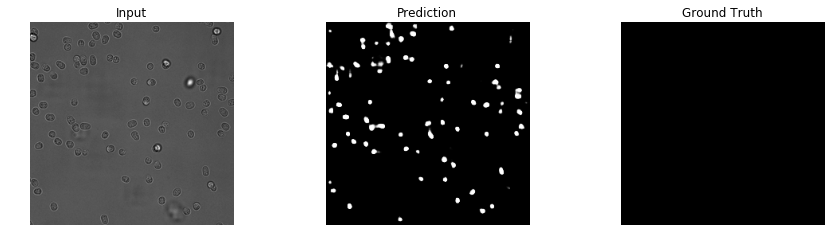

In [9]:
x_data_test, y_data_test = My_Data.Batch_train(1)


Predict_data,X_flip,Y_flip = sess.run([prediction,x_image,y_image], feed_dict={xs: x_data_test, ys: y_data_test, keep_prob: 1,is_training: 1,tst: False,iter: 1})

print str(sess.run(loss, feed_dict={xs: x_data_test, ys: y_data_test, keep_prob: 1,is_training: 1,tst: False,iter: 1}))

# Performance_Autoencoder(x_data_test,X_flip,Predict_data,InputSize,IMAGE_x_SIZE)
Performance(x_data_test,y_data_test,X_flip,Y_flip,Predict_data,InputSize,OutputSize,IMAGE_x_SIZE,IMAGE_y_SIZE)

In [51]:
# PSNR SSIM

In [43]:
My_Data.RandomLoad()  # Load data

Loading ... 
Loading done! time:  44.2844359875


8366.07
Segmentation!


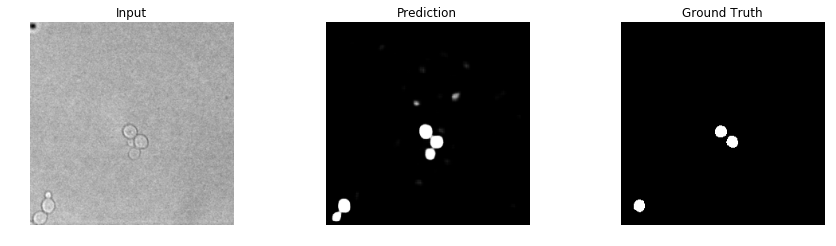

In [25]:
x_data_test, y_data_test = My_Data.Batch_Prediction(60)

Predict_data,X_flip,Y_flip = sess.run([prediction,x_image,y_image], feed_dict={xs: x_data_test, ys: y_data_test, keep_prob: 1,is_training: 1,tst: False,iter: 1})

print str(sess.run(loss, feed_dict={xs: x_data_test, ys: y_data_test, keep_prob: 1,is_training: 1,tst: False,iter: 1}))

# Performance_Autoencoder(x_data_test,X_flip,Predict_data,InputSize,IMAGE_x_SIZE)
Performance(x_data_test,y_data_test,X_flip,Y_flip,Predict_data,InputSize,OutputSize,IMAGE_x_SIZE,IMAGE_y_SIZE)

In [15]:
# Combine Prediction and Input
Output = pd.DataFrame(np.concatenate([Predict_data.reshape([-1]),X_flip.reshape([-1])]))

# Write it into csv
Output.to_csv('/Users/Nevaeh/PythonCSCourse/XcodePython/FindCell2/Step3_Performance/prediction.csv',index=None)
print "Result has been writen into csv files !"

Result has been writen into csv files !


In [123]:
Input=pd.read_csv('/Users/Nevaeh/PythonCSCourse/XcodePython/FindCell2/matlab/ImageProcessing/out.csv',',')

#### test  中间输出

In [10]:
x_data_test, y_data_test = My_Data.Batch_Prediction(71)

9605.16
Segmentation!


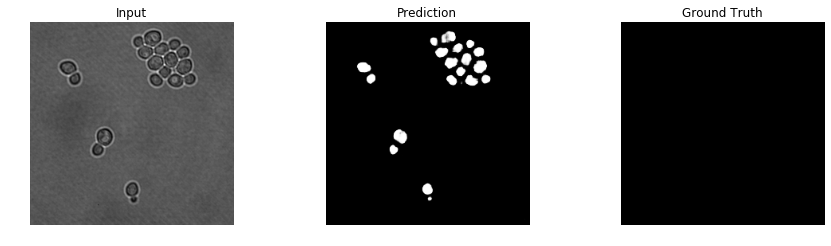

In [11]:
Predict_data,X_flip,Y_flip = sess.run([prediction,x_image,y_image], feed_dict={xs: x_data_test, ys: y_data_test, keep_prob: 1,is_training: 1,tst: False,iter: 1})

print str(sess.run(loss, feed_dict={xs: x_data_test, ys: y_data_test, keep_prob: 1,is_training: 1,tst: False,iter: 1}))

# Performance_Autoencoder(x_data_test,X_flip,Predict_data,InputSize,IMAGE_x_SIZE)
Performance(x_data_test.T,y_data_test.T,X_flip.T,Y_flip.T,Predict_data.T,InputSize,OutputSize,IMAGE_x_SIZE,IMAGE_y_SIZE)

plt.savefig('Input.eps')

In [12]:
print 'Parameters Number:', (5*5*1+1)*32 + (5*5*32+1)*64 + (5*5*64+1)*32 + (5*5*32+1)*1

Parameters Number: 104129


#### layer 1

In [12]:
Temp,X_flip,Y_flip = sess.run([h_pool1,x_image,y_image], feed_dict={xs: x_data_test, ys: y_data_test, keep_prob: 1,is_training: 1,tst: False,iter: 1})
Temp = Temp.reshape(Temp.shape[1:])

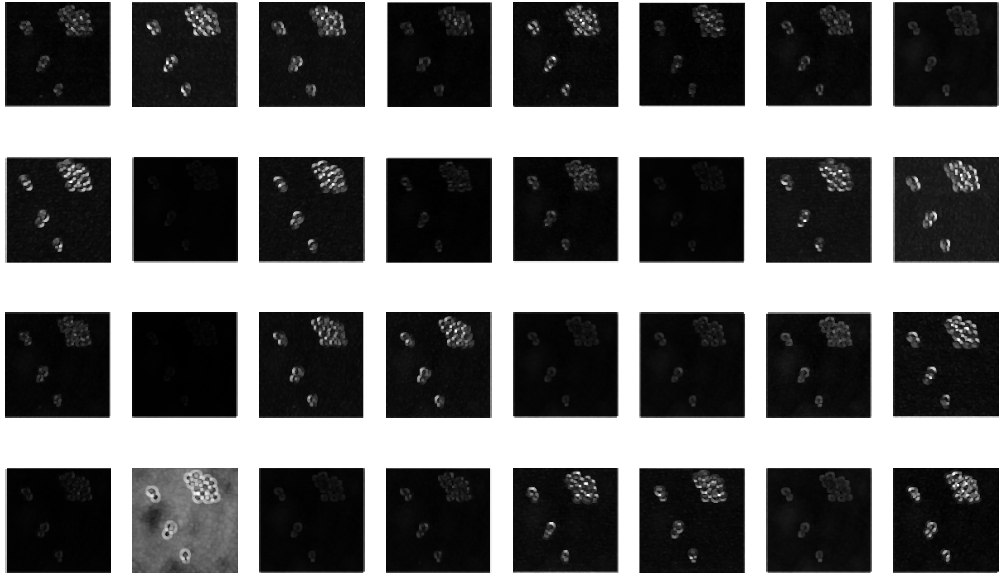

In [13]:
plt.figure(1,figsize=(100,60))

mycmap = cm.get_cmap('gray')

for i in np.arange(Temp.shape[2]):
    plt.subplot(Temp.shape[2]/8,8,i+1)
    imshow(Temp[:,:,i],cmap=mycmap)  
    plt.axis('off')
    
plt.savefig('Layer1.eps')

### layer2

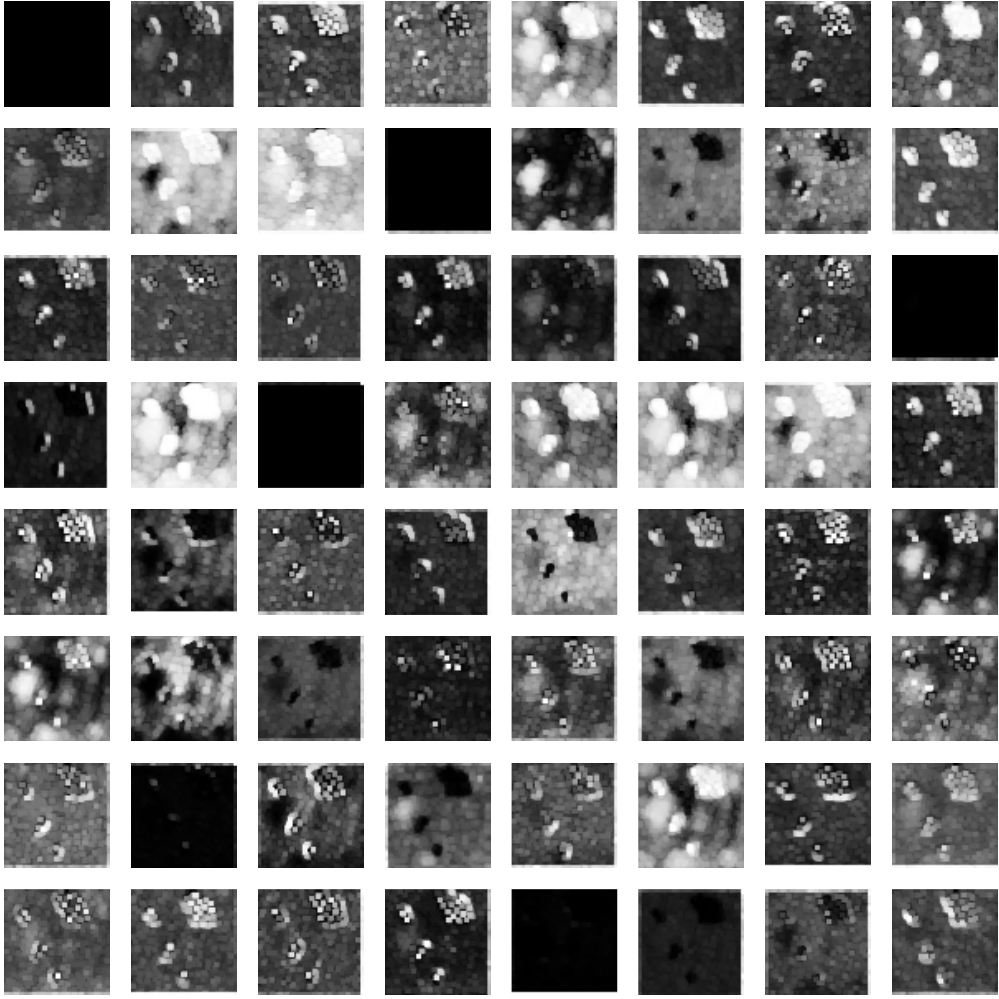

In [14]:
Temp,X_flip,Y_flip = sess.run([h_pool2,x_image,y_image], feed_dict={xs: x_data_test, ys: y_data_test, keep_prob: 1,is_training: 1,tst: False,iter: 1})
Temp = Temp.reshape(Temp.shape[1:])

plt.figure(1,figsize=(100,100))

mycmap = cm.get_cmap('gray')

for i in np.arange(Temp.shape[2]):
    plt.subplot(Temp.shape[2]/8,8,i+1)
    imshow(Temp[:,:,i],cmap=mycmap)
    plt.axis('off')
plt.savefig('Layer2.eps')

### layer3

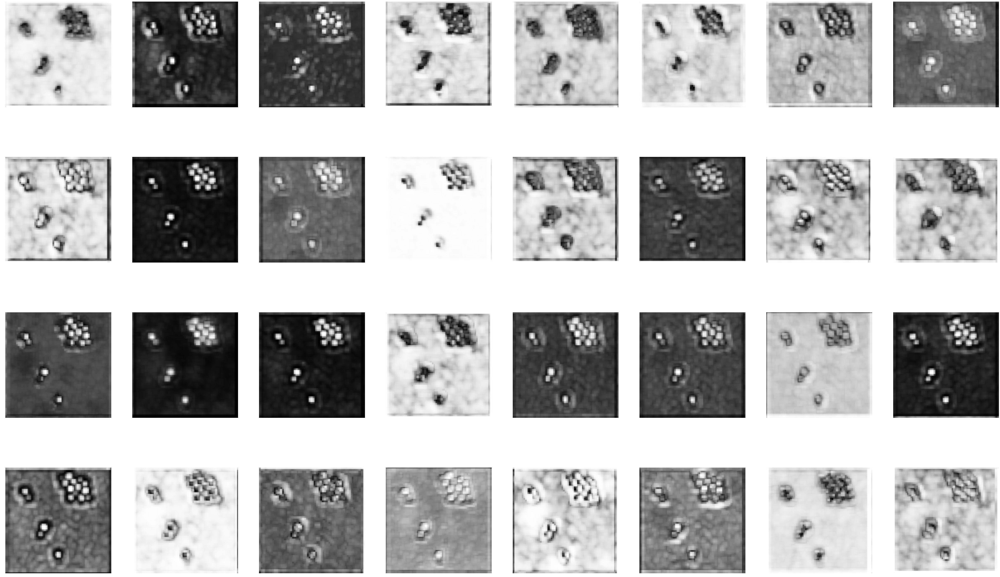

In [15]:
Temp,X_flip,Y_flip = sess.run([h_depool2,x_image,y_image], feed_dict={xs: x_data_test, ys: y_data_test, keep_prob: 1,is_training: 1,tst: False,iter: 1})
Temp = Temp.reshape(Temp.shape[1:])

plt.figure(1,figsize=(100,60))

mycmap = cm.get_cmap('gray')

for i in np.arange(Temp.shape[2]):
    plt.subplot(Temp.shape[2]/8,8,i+1)
    imshow(Temp[:,:,i],cmap=mycmap)
    plt.axis('off')
plt.savefig('Layer3.eps')

In [16]:
#     W_conv1 = weight_variable([5,5,1,Depth_1])   # patch 5x5, in size 512 x 512 x 1, out size 256 x 256 x 2
#     b_conv1 = bias_variable([Depth_1])
#     h_conv1 = tf.nn.sigmoid(conv2d(x_image,W_conv1) + b_conv1, name = 'Convolution1') # output size n/2xn/2x32
#     h_pool1 = max_pool_2x2(h_conv1,name = 'Pooling1')                              # output size n/2xn/2x32

# ## conv2 layer ##
# with tf.name_scope('Conv2_layer'):
#     W_conv2 = weight_variable([5,5,Depth_1,Depth_2])   # patch 3x3, in size 256 x 256 x 2, out size 128 x 128 x 4
#     b_conv2 = bias_variable([Depth_2])
#     h_conv2 = tf.nn.sigmoid(conv2d(h_pool1,W_conv2) + b_conv2, name = 'Convolution2') # output size n/4xn/4x16
#     h_pool2 = max_pool_2x2(h_conv2,name = 'Pooling2')                              # output size n/4xn/4x16

# ## deconv2 layer ##
# with tf.name_scope('deConv2_layer'):
#     W_deconv2 = weight_variable([5,5,Depth_1,Depth_2]) #??  # patch 3x3, in size 128x128x4, out size 256x256x2
#     b_deconv2 = bias_variable([Depth_1])
#     h_deconv2 = tf.sigmoid(deconv2d(h_pool2,W_deconv2,[1,IMAGE_x_SIZE/2,IMAGE_x_SIZE/2,Depth_1]) + b_deconv2, name = 'deConvolution2') # output size n/2xn/2x16
#     h_depool2 = max_pool_2x2(h_deconv2,name = 'Pooling_2')                                 # output size n/4xn/4x16

# ## deconv1 layer ##
# with tf.name_scope('deConv1_layer'):
#     W_deconv1  = weight_variable([5,5,1,Depth_1]) #??  # patch 3x3, in size 256x256x2, input size 512*512*1
#     b_deconv1  = bias_variable([1])
#     prediction = tf.sigmoid(deconv2d(h_depool2,W_deconv1,[1,IMAGE_x_SIZE,IMAGE_x_SIZE,1])+b_deconv1)   # output size n/2xn/2x16

### Kernal 1 : W

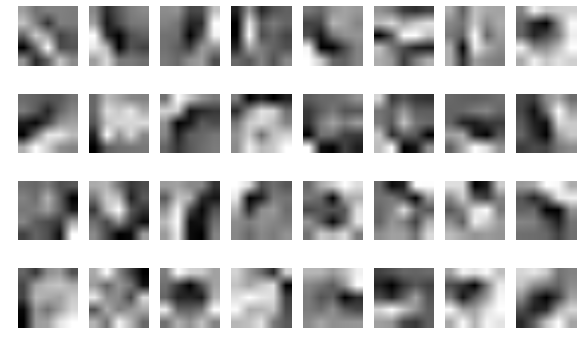

In [14]:
Temp = sess.run(W_conv1)
Temp = Temp.reshape(5,5,-1)

plt.figure(1,figsize=(10,6))

mycmap = cm.get_cmap('gray')

for i in np.arange(Temp.shape[2]):
    plt.subplot(Temp.shape[2]/8,8,i+1)
    imshow(Temp[:,:,i],cmap=mycmap)
    plt.axis('off')
plt.savefig('Kernal1.eps')

### Kernel -1

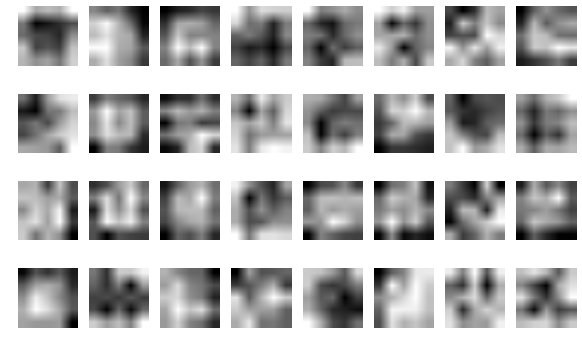

In [18]:
Temp = sess.run(W_deconv1)
Temp = Temp.reshape(5,5,-1)

plt.figure(1,figsize=(10,6))

mycmap = cm.get_cmap('gray')

for i in np.arange(Temp.shape[2]):
    plt.subplot(Temp.shape[2]/8,8,i+1)
    imshow(Temp[:,:,i],cmap=mycmap)
    plt.axis('off')
plt.savefig('Kernal4.eps')

### Kernel 2

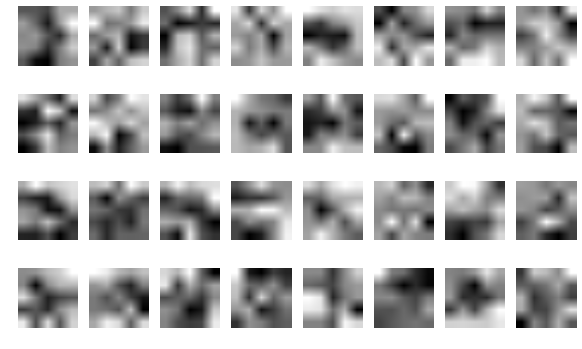

In [19]:
for j in np.arange(64):
    Temp = sess.run(W_conv2)
    Temp = Temp[:,:,:,j]

    plt.figure(1,figsize=(10,6))

    mycmap = cm.get_cmap('gray')

    for i in np.arange(Temp.shape[2]):
        plt.subplot(Temp.shape[2]/8,8,i+1)
        imshow(Temp[:,:,i],cmap=mycmap)
        plt.axis('off')
    plt.savefig('Kernal2_'+str(j)+'.eps')

### Kernel -2

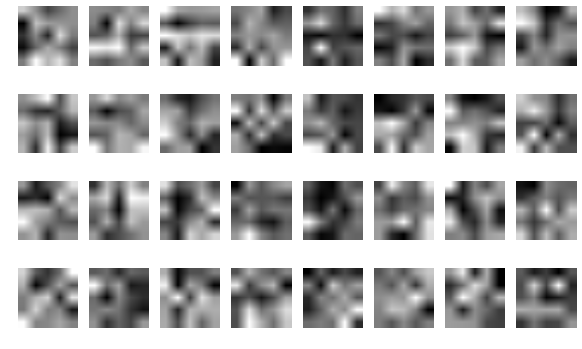

In [20]:
for j in np.arange(64):
    Temp = sess.run(W_deconv2)
    Temp = Temp[:,:,:,j]

    plt.figure(1,figsize=(10,6))

    mycmap = cm.get_cmap('gray')

    for i in np.arange(Temp.shape[2]):
        plt.subplot(Temp.shape[2]/8,8,i+1)
        imshow(Temp[:,:,i],cmap=mycmap)
        plt.axis('off')
    plt.savefig('Kernal3_'+str(j)+'.eps')

### ` every 100 epohs test same input`

In [14]:
def Collection(Predict_data,X_flip, Output): 
    Temp   = pd.DataFrame(np.concatenate([Predict_data.reshape([-1]),X_flip.reshape([-1])])).T
    Output = pd.concat([Output,Temp])
    Output.T.to_csv('/Users/Nevaeh/PythonCSCourse/XcodePython/FindCell2/matlab/ImageProcessing/out.csv',index=None)
    print "Result has been writen into csv files !"
    return Output

In [15]:
# predict same picture
Predict_data,X_flip,Y_flip = sess.run([prediction,x_image,y_image], feed_dict={xs: x_temp, ys: y_temp, keep_prob: 1,is_training: 1,tst: False,iter: 1})

# write into 
Output = Collection(Predict_data, X_flip, Output)

TypeError: Collection() takes exactly 3 arguments (2 given)

In [11]:

###-- -------------------------------------- --###
###--      Part 5: Moniter Gif : start       --###

def Collection(Predict_data,X_flip,Output):
    Temp   = pd.DataFrame(np.concatenate([Predict_data.reshape([-1]),X_flip.reshape([-1])])).T
    Output = pd.concat([Output,Temp])
    Output.T.to_csv('out.csv',index=None)
    print "Result has been writen into csv files !"
    return Output

In [18]:

# predict same picture
x_temp, y_temp = My_Data.Batch_train(1)  #load training data

# init Output
Output = pd.DataFrame(np.concatenate([y_temp.reshape([-1]),x_temp.reshape([-1])])).T



In [20]:
# predict same picture
Predict_data,X_flip,Y_flip = sess.run([prediction,x_image,y_image], feed_dict={xs: x_temp, ys: y_temp, keep_prob: 1,is_training: 1,tst: False,iter: 1})
# write into csv
Output = Collection(Predict_data,X_flip,Output)


In [24]:
Output = pd.concat([Output,Temp])



In [25]:

Output.T.to_csv('out.csv',index=None)
print "Result has been writen into csv files !"

###--      Part 5: Moniter Gif : End         --###
###-- -------------------------------------- --###



Result has been writen into csv files !


SyntaxError: 'return' outside function (<ipython-input-25-42ac69f63d50>, line 4)

In [125]:


reshaped_image = tf.cast(tf.reshape(xs, [InputSize,InputSize,1]), tf.float32)

height = InputSize
width  = InputSize
# distorted_image = tf.image.random_saturation(reshaped_image, [height, width,1])
distorted_image = tf.random_crop(distorted_image, [height, width,1])

# Randomly flip the image horizontally.
# distorted_image = tf.image.random_flip_left_right(distorted_image)
distorted_image = tf.image.random_flip_left_right(distorted_image)
distorted_image = tf.image.random_flip_up_down(distorted_image)


# # Because these operations are not commutative, consider randomizing
# # randomize the order their operation.
distorted_image = tf.image.random_brightness(distorted_image, max_delta=63)
distorted_image = tf.image.random_contrast(distorted_image,
                                         lower=0.2, upper=1.8)


NameError: name 'distorted_image' is not defined

In [126]:
x_data_test, y_data_test = My_Train.Batch_test(1)
Distorure = sess.run(distorted_image,feed_dict={xs:x_data_test})

NameError: name 'My_Train' is not defined

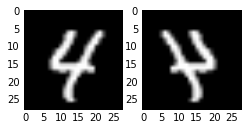

In [166]:
mycmap = cm.get_cmap('gray')

plt.subplot(1,3,1)
plt.imshow(x_data_test.reshape([InputSize,InputSize]),cmap=mycmap)
plt.subplot(1,3,2)
plt.imshow(Distorure.reshape([InputSize,InputSize]),cmap=mycmap)



In [56]:
# def distorted_inputs(xs,ys,InputSize,OutputSize,IMAGE_x_SIZE,IMAGE_y_SIZE)
#     """Construct distorted input for training.

#     Args:
#         xs: Images. 1D tensor of [Batchsize*InputSize*InputSize*1].
#         ys: Labels. 1D tensor of [Batchsize*InputSize*InputSize*1].

#     Returns:
#         images: Images. 4D tensor of [batch_size, IMAGE_SIZE, IMAGE_SIZE, 1] size.
#         labels: Labels. 4D tensor of [batch_size, IMAGE_SIZE, IMAGE_SIZE, 1] size.
#     """

distorted_image = tf.cast(tf.reshape(xs, [InputSize,InputSize,1]), tf.float32)

# distorted_image = tf.image.random_saturation(reshaped_image, [InputSize, InputSize,1])
distorted_image = tf.random_crop(distorted_image, [14, 14,1],seed=2)

# Randomly flip the image horizontally.
# distorted_image = tf.image.random_flip_left_right(distorted_image)
# distorted_image = tf.image.random_flip_up_down(distorted_image)

Distorure = sess.run(distorted_image,feed_dict={xs:x_data_test})